# Inference Demo with Pretrained Models

This demo shows how to run inference on a custom scene and visualize the results.

1. Prepare the data and the pretrained model.

Extract the data here and the directory structure should be as below

```
demo
├── sample_data
│   ├── office
│   ├── ...
├── demo.py
├── demo.ipynb
```



2. Build the model with pretrained weights.

In [1]:
import os
import warnings
from copy import deepcopy
from pathlib import Path
from typing import Optional, Union

import numpy as np
import torch
from mmengine.config import Config
from mmengine.dataset import Compose, pseudo_collate
from mmengine.registry import init_default_scope
from mmengine.runner import load_checkpoint
from scipy.spatial.transform import Rotation as R
from embodiedscan.registry import MODELS, DATASETS

def init_model(config: Union[str, Path, Config],
               checkpoint: Optional[str] = None,
               device: str = 'cuda:0',
               cfg_options: Optional[dict] = None):
    """Initialize a model from config file, which could be a 3D detector or a
    3D segmentor.

    Args:
        config (str, :obj:`Path`, or :obj:`mmengine.Config`): Config file path,
            :obj:`Path`, or the config object.
        checkpoint (str, optional): Checkpoint path. If left as None, the model
            will not load any weights.
        device (str): Device to use.
        cfg_options (dict, optional): Options to override some settings in
            the used config.

    Returns:
        nn.Module: The constructed detector.
    """
    if isinstance(config, (str, Path)):
        config = Config.fromfile(config)
    elif not isinstance(config, Config):
        raise TypeError('config must be a filename or Config object, '
                        f'but got {type(config)}')
    if cfg_options is not None:
        config.merge_from_dict(cfg_options)

    config.model.train_cfg = None
    init_default_scope(config.get('default_scope', 'mmdet3d'))
    model = MODELS.build(config.model)

    if checkpoint is not None:
        checkpoint = load_checkpoint(model, checkpoint, map_location='cpu')
        # save the dataset_meta in the model for convenience
        model.dataset_meta = checkpoint['meta']['dataset_meta']

        test_dataset_cfg = deepcopy(config.test_dataloader.dataset)
        # lazy init. We only need the metainfo.
        test_dataset_cfg['lazy_init'] = True
        metainfo = DATASETS.build(test_dataset_cfg).metainfo
        cfg_palette = metainfo.get('palette', None)
        if cfg_palette is not None:
            model.dataset_meta['palette'] = cfg_palette
        else:
            if 'palette' not in model.dataset_meta:
                warnings.warn(
                    'palette does not exist, random is used by default. '
                    'You can also set the palette to customize.')
                model.dataset_meta['palette'] = 'random'

    model.cfg = config  # save the config in the model for convenience
    if device != 'cpu':
        torch.cuda.set_device(device)
    else:
        warnings.warn('Don\'t suggest using CPU device. '
                      'Some functions are not supported for now.')

    model.to(device)
    model.eval()
    return model

config_path = '../config/detection/embodied-det3d_8xb1_embodiedscan-3d-284class-9dof-mlvl.py'
checkpoint_path = '../ckpt/continuous.pth'
device = 'cuda:0'

model = init_model(config_path, checkpoint_path, device=device)
cfg = model.cfg
classes = list(cfg.metainfo.classes)

/home/maoxiaohan/anaconda3/envs/embodiedscan/lib/python3.8/site-packages/MinkowskiEngine/__init__.py:36: UserWarning: The environment variable `OMP_NUM_THREADS` not set. MinkowskiEngine will automatically set `OMP_NUM_THREADS=16`. If you want to set `OMP_NUM_THREADS` manually, please export it on the command line before running a python script. e.g. `export OMP_NUM_THREADS=12; python your_program.py`. It is recommended to set it below 24.
  warnings.warn(


Loads checkpoint by local backend from path: ../ckpt/continuous.pth
02/01 14:16:50 - mmengine - WARNING - euler-depth is not a meta file, simply parsed as meta information


/tmp/ipykernel_4044415/3694821533.py:61: UserWarning: palette does not exist, random is used by default. You can also set the palette to customize.
  warnings.warn(


3. Load the data and construct model input

In [2]:
from embodiedscan.structures.bbox_3d import get_box_type

test_pipeline = deepcopy(cfg.test_dataloader.dataset.pipeline)
test_pipeline = Compose(test_pipeline)

root_dir = './sample_data'
scene_name = 'office'
data_dir = os.path.join(root_dir, scene_name)
with open(os.path.join(data_dir, 'poses.txt'), 'r') as f:
    poses = f.readlines()

axis_align_matrix = np.loadtxt(os.path.join(data_dir, 'axis_align_matrix.txt'))
intrinsic = np.loadtxt(os.path.join(data_dir, 'intrinsic.txt'))
intrinsic = intrinsic.astype(np.float32)
box_type = get_box_type('Euler-Depth')
info = dict(
    axis_align_matrix=axis_align_matrix,
    images=[],
    img_path=[],
    depth_img_path=[],
    depth2img=dict(extrinsic=[],
                    intrinsic=intrinsic,
                    origin=np.array([.0, .0, .5]).astype(np.float32)),
    depth_cam2img=intrinsic,
    depth_shift=1000.0,
    cam2img=intrinsic,
    box_type_3d=box_type[0],
    box_mode_3d=box_type[1],
    ann_info=dict(  # empty annotation
        gt_bboxes_3d=np.zeros((0, 9), dtype=np.float32),
        gt_labels_3d=np.zeros((0, ), dtype=np.int64),
        visible_instance_masks=[[] for i in range(len(poses))]))
n_frames = len(poses)
data = []
for i in range(1, n_frames):
    timestamp, x, y, z, qx, qy, qz, qw = poses[i].split()
    x, y, z, qx, qy, qz, qw = float(x), float(y), float(z), float(
        qx), float(qy), float(qz), float(qw)
    rot_matrix = R.from_quat([qx, qy, qz, qw]).as_matrix()
    transform_matrix = np.identity(4)
    transform_matrix[:3, :3] = rot_matrix @ [[0, 0, 1], [-1, 0, 0],
                                                [0, -1, 0]]
    transform_matrix[:3, 3] = [x, y, z]  # CAM to NOT ALIGNED GLOBAL

    image_ann = dict(img_path=os.path.join('demo', scene_name, 'rgb',
                                            timestamp + '.jpg'),
                     depth_path=os.path.join('demo', scene_name, 'depth',
                                             timestamp + '.png'),
                     cam2global=transform_matrix,
                     cam2img=intrinsic)
    info['images'].append(image_ann)
    info['img_path'].append(
        os.path.join(data_dir, 'rgb', timestamp + '.jpg'))
    info['depth_img_path'].append(
        os.path.join(data_dir, 'depth', timestamp + '.png'))
    align_global2cam = np.linalg.inv(axis_align_matrix @ transform_matrix)
    info['depth2img']['extrinsic'].append(
        align_global2cam.astype(np.float32))

info_ = test_pipeline(info)
data.append(info_)

collate_data = pseudo_collate(data)

4. Forward the model

In [3]:
with torch.no_grad():
    results = model.test_step(collate_data)

# remove model from GPU to free memory
del model
torch.cuda.empty_cache()

5. Collect results and construct input for visualizer

In [4]:
def nms_filter(pred_results, iou_thr=0.15, score_thr=0.075, topk_per_class=10):
    """Non-Maximum Suppression for 3D Euler boxes. Additionally, only the top-k
    boxes will be kept for each category to avoid redundant boxes
    in the visualization.

    Args:
        pred_results (mmengine.structures.instance_data.InstanceData):
            Results predicted by the model
        iou_thr (float): IoU thresholds for NMS. Defaults to 0.15.
        score_thr (float): Score thresholds.
            Instances with scores below thresholds will not be kept.
            Defaults to 0.075.
        topk_per_class (int): Number of instances kept per category.

    Returns:
        boxes (numpy.ndarray[float]): filtered instances, shape (N,9)
        labels (numpy.ndarray[int]): filtered labels, shape (N,)
    """
    boxes = pred_results.bboxes_3d
    boxes_tensor = boxes.tensor.cpu().numpy()
    iou = boxes.overlaps(boxes, boxes, eps=1e-5)
    score = pred_results.scores_3d.cpu().numpy()
    label = pred_results.labels_3d.cpu().numpy()
    selected_per_class = dict()

    n = boxes_tensor.shape[0]
    idx = list(range(n))
    idx.sort(key=lambda x: score[x], reverse=True)
    selected_idx = []
    for i in idx:
        if selected_per_class.get(label[i], 0) >= topk_per_class:
            continue
        if score[i] < score_thr:
            continue
        bo = False
        for j in selected_idx:
            if iou[i][j] > iou_thr:
                bo = True
                break
        if not bo:
            selected_idx.append(i)
            if label[i] not in selected_per_class:
                selected_per_class[label[i]] = 1
            else:
                selected_per_class[label[i]] += 1

    return boxes_tensor[selected_idx], label[selected_idx]

filtered_results = []
for i in range(len(results)):
    boxes, labels = nms_filter(results[i].pred_instances_3d)
    filtered_results.append((boxes, labels))

selected_image = [
    info['img_path'].index(img_path)
    for img_path in collate_data['data_samples'][0].img_path
]
pseudo_ann = dict(sample_idx=f'demo/{scene_name}',
                  axis_align_matrix=axis_align_matrix,
                  images=[],
                  cam2img=intrinsic,
                  depth_cam2img=intrinsic,
                  instances=[])
for i in range(len(results)):
    image_ann = info['images'][selected_image[i]]
    image_ann['visible_instance_ids'] = []
    boxes, labels = filtered_results[i]
    for j in range(boxes.shape[0]):
        pseudo_ann['instances'].append(
            dict(bbox_3d=boxes[j], bbox_label_3d=labels[j]))
        instance_id = len(pseudo_ann['instances']) - 1
        image_ann['visible_instance_ids'].append(instance_id)
    pseudo_ann['images'].append(image_ann)

metainfo = {'categories': classes}
packed_pseudo_ann = {'metainfo': metainfo, 'data_list': [pseudo_ann]}

6. Visualize the results

In [5]:
from embodiedscan.explorer import EmbodiedScanExplorer
visualizer = EmbodiedScanExplorer(data_root={'demo': root_dir},
                                  ann_file=[packed_pseudo_ann])
visualizer.render_continuous_scene(f'demo/{scene_name}')

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Press N/D/Right Arrow to draw next frame.
Press Q to close the window and quit.
When you've rendered a lot of frames, the exit can become very slow because the program needs time to free up space.
You can also press Esc to close window immediately, which may result in a segmentation fault.


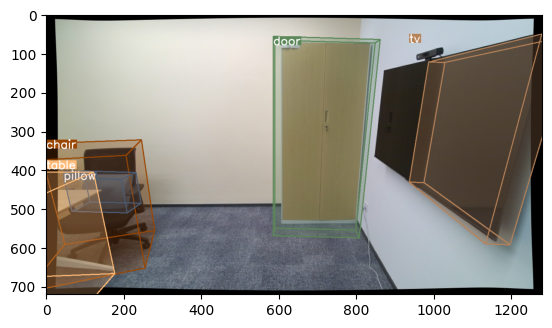

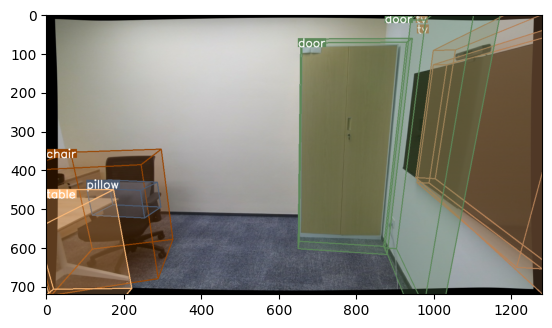

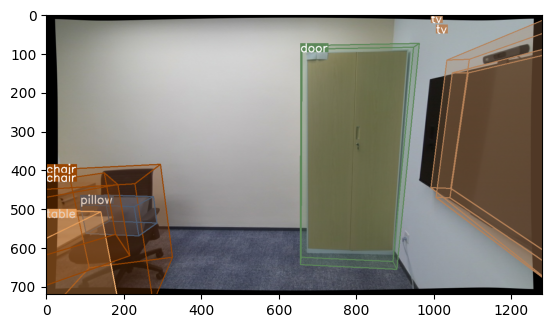

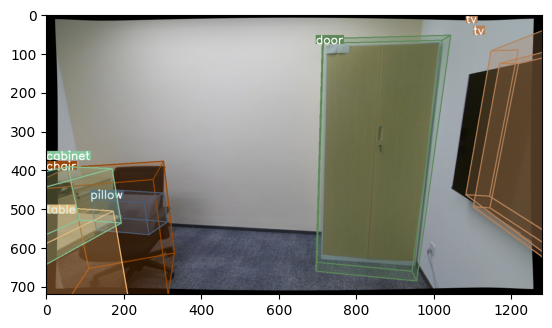

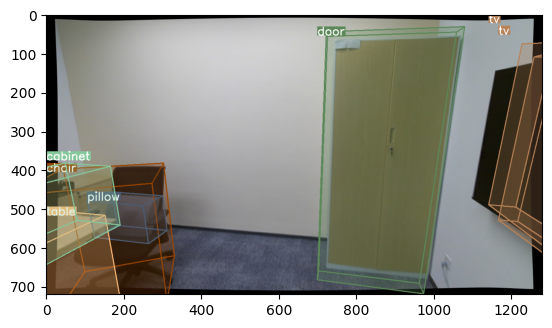

...

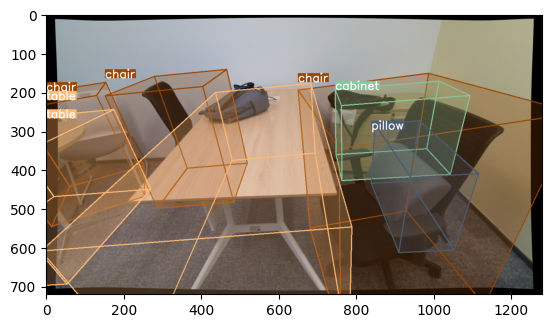

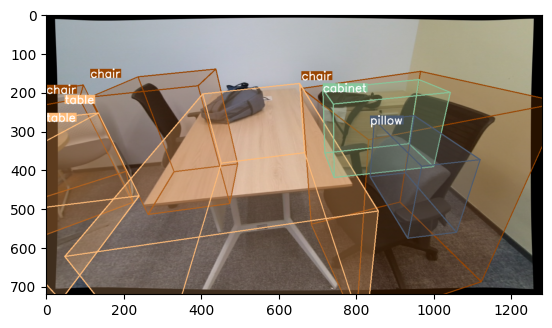

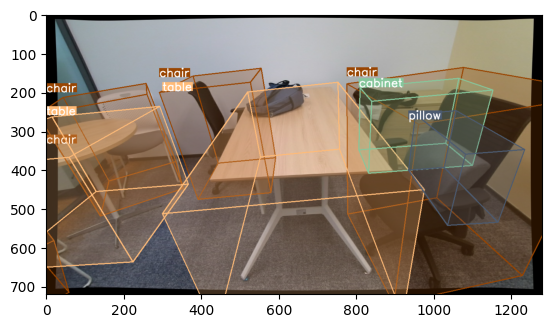

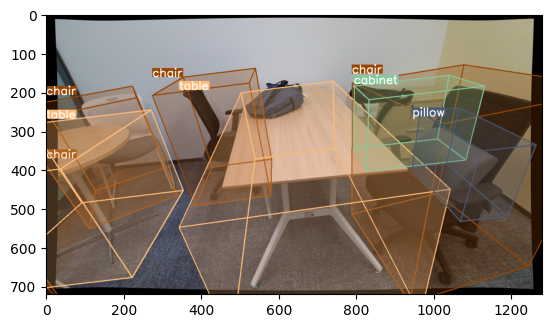

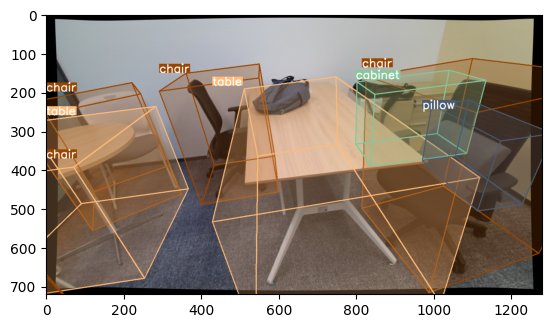

In [6]:
for i in range(len(results)):
    cam_name = pseudo_ann['images'][i]['img_path'].split('/')[-1][:-4]
    visualizer.show_image(f'demo/{scene_name}',
                          camera_name=cam_name,
                          render_box=True)